# Importing Libraries and Dataset

In [1]:
#Import Libraries
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import math
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
#Import Data

from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
pd.options.display.max_rows = 100
pd.options.display.max_columns = 100

# Preliminary Exploration

In [4]:
# think it'll be easiest to add shortcut in drive for everyone, then can run this line alr!
df = pd.read_csv('drive/MyDrive/BT4012/india fraud dataset/india_fraud.csv')
df

,CustomerID,ReportedFraud,DateOfIncident,TypeOfIncident,TypeOfCollission,SeverityOfIncident,AuthoritiesContacted,IncidentState,IncidentCity,IncidentAddress,IncidentTime,NumberOfVehicles,PropertyDamage,BodilyInjuries,Witnesses,PoliceReport,AmountOfTotalClaim,AmountOfInjuryClaim,AmountOfPropertyClaim,AmountOfVehicleDamage,InsuredAge,InsuredZipCode,InsuredGender,InsuredEducationLevel,InsuredOccupation,InsuredHobbies,CapitalGains,CapitalLoss,Country,InsurancePolicyNumber,CustomerLoyaltyPeriod,DateOfPolicyCoverage,InsurancePolicyState,Policy_CombinedSingleLimit,Policy_Deductible,PolicyAnnualPremium,UmbrellaLimit,InsuredRelationship,VehicleID,VehicleMake,VehicleModel,VehicleYOM
0,Cust20065,N,2015-01-09,Multi-vehicle Collision,Rear Collision,Total Loss,Other,State9,City4,Location 1404,19,3,?,1,1,?,43973,9396,4698,29879,58,471784,MALE,JD,sales,video-games,0,-42700,India,129186,432,1998-11-14,State2,250/500,2000,1142.87,0,own-child,Vehicle30662,Mercedes,E400,2005
1,Cust37589,N,2015-02-20,Single Vehicle Collision,Side Collision,Minor Damage,Ambulance,State4,City3,Location 1675,14,1,?,1,1,YES,62310,6539,6539,49232,34,431937,FEMALE,High School,transport-moving,polo,51300,0,India,146710,128,2000-08-19,State2,100/300,1000,1274.38,2857344,own-child,Vehicle17183,Toyota,Highlander,2010
2,Cust24312,N,2015-01-14,Multi-vehicle Collision,Side Collision,Major Damage,Ambulance,State5,City2,Location 1546,21,3,?,0,0,?,42824,6069,6069,30686,52,479320,FEMALE,PhD,machine-op-inspct,exercise,0,0,India,133433,346,2000-06-23,State1,500/1000,745,1269.93,0,other-relative,Vehicle33982,Volkswagen,Passat,2002
3,Cust5493,Y,2015-01-07,Multi-vehicle Collision,Side Collision,Major Damage,Ambulance,State7,City4,Location 1413,12,3,YES,2,0,?,45672,253,5741,39678,25,607763,FEMALE,College,exec-managerial,exercise,47400,-56100,India,114614,42,1992-01-15,State2,100/300,986,1218.60,0,other-relative,Vehicle12299,Toyota,Highlander,2011
4,Cust7704,Y,2015-02-26,Multi-vehicle Collision,Side Collision,Major Damage,Other,State4,City6,Location 1367,3,3,NO,1,2,NO,81472,7407,14813,59252,27,441783,MALE,Masters,sales,chess,0,0,India,116825,109,2001-09-23,State3,250/500,576,1431.02,4235779,unmarried,Vehicle30447,Ford,Wrangler,2010
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28831,Cust9773,N,2015-02-13,Single Vehicle Collision,Side Collision,Minor Damage,Fire,State7,City3,Location 1324,16,1,NO,1,2,?,50515,5543,5543,39429,39,454139,MALE,JD,farming-fishing,basketball,0,0,India,118894,251,2007-02-07,State2,250/500,1000,1108.55,739864,unmarried,Vehicle24503,Nissan,RSX,2002
28832,Cust38439,N,2015-01-19,Multi-vehicle Collision,Side Collision,Total Loss,Police,State5,City3,Location 1880,19,3,YES,2,0,?,94920,8678,8738,77504,21,463809,MALE,Associate,prof-specialty,golf,20000,-75000,India,147560,14,2006-10-18,State2,100/300,1008,1551.84,41592,own-child,Vehicle9733,Accura,RSX,2014
28833,Cust38444,N,2015-01-21,Multi-vehicle Collision,Side Collision,Total Loss,Police,State5,City7,Location 1632,16,3,YES,2,0,NO,87893,13224,7990,66679,35,444155,MALE,Associate,prof-specialty,golf,0,-75000,India,147565,153,2011-11-23,State1,100/300,660,1119.32,0,not-in-family,Vehicle1823,Saab,RSX,2013
28834,Cust26466,N,2015-01-02,Parked Car,?,Trivial Damage,None,State4,City7,Location 1364,12,1,?,1,1,?,7284,728,1457,5099,40,603123,FEMALE,Masters,exec-managerial,reading,0,-63900,India,135587,241,1997-08-04,State3,250/1000,1674,1229.88,4674160,wife,Vehicle9113,Accura,RSX,2004


### Preliminary EDA with Pandas Profiling

In [5]:
identity_cols = ['CustomerID','VehicleID','InsurancePolicyNumber']
binary_cols = ['ReportedFraud']
binary_w_missing = ['PoliceReport','InsuredGender']
datetime_cols = ['DateOfIncident','IncidentTime','VehicleYOM', 'DateOfPolicyCoverage']
cat_ohe = ['TypeOfIncident','AuthoritiesContacted','IncidentState','IncidentCity','IncidentAddress','InsuredZipCode','InsuredOccupation','InsuredHobbies','Country','InsurancePolicyState','Policy_CombinedSingleLimit','InsuredRelationship','VehicleMake','VehicleModel']
cat_ord = ['SeverityOfIncident','InsuredEducationLevel', 'PropertyDamage']
numeric_cols = ['NumberOfVehicles','BodilyInjuries','Witnesses','AmountOfTotalClaim','AmountOfInjuryClaim','AmountOfPropertyClaim','AmountOfVehicleDamage','InsuredAge','CapitalGains','CapitalLoss','CustomerLoyaltyPeriod','Policy_Deductible','PolicyAnnualPremium','UmbrellaLimit']

In [6]:
df.describe()

,IncidentTime,NumberOfVehicles,BodilyInjuries,AmountOfInjuryClaim,AmountOfPropertyClaim,AmountOfVehicleDamage,InsuredAge,InsuredZipCode,CapitalGains,CapitalLoss,InsurancePolicyNumber,CustomerLoyaltyPeriod,Policy_Deductible,PolicyAnnualPremium,UmbrellaLimit,VehicleYOM
count,28836.000000,28836.000000,28836.000000,28836.000000,28836.000000,28836.000000,28836.000000,28836.000000,28836.000000,28836.000000,28836.000000,28836.000000,28836.000000,28836.000000,2.883600e+04,28836.000000
mean,11.746047,1.823207,0.985782,7337.118428,7283.870197,37687.129387,38.815370,502436.579068,23066.569566,-24940.612429,129312.517097,203.067867,1114.282529,1255.528382,9.836680e+05,2005.093113
std,6.170069,0.980099,0.784764,4427.638593,4375.842738,17977.048232,7.996377,72250.868871,27637.813724,27913.209608,11114.060267,99.932951,546.632816,223.013899,1.969282e+06,5.309956
min,-5.000000,1.000000,0.000000,0.000000,0.000000,109.000000,19.000000,430104.000000,0.000000,-111100.000000,110122.000000,1.000000,500.000000,-1.000000,-1.000000e+06,1995.000000
25%,6.000000,1.000000,0.000000,4743.750000,4862.000000,32193.250000,33.000000,448603.000000,0.000000,-50000.000000,119698.750000,126.000000,622.000000,1122.007500,0.000000e+00,2001.000000
50%,12.000000,1.000000,1.000000,7147.000000,7051.000000,42457.500000,38.000000,466691.000000,0.000000,0.000000,129278.500000,199.000000,1000.000000,1265.205000,0.000000e+00,2005.000000
75%,17.000000,3.000000,2.000000,10571.250000,10327.000000,49535.750000,44.000000,603848.000000,49000.000000,0.000000,138933.250000,267.000000,1627.000000,1396.605000,4.859610e+05,2010.000000
max,23.000000,4.000000,2.000000,21450.000000,23670.000000,79560.000000,64.000000,620962.000000,100500.000000,0.000000,148619.000000,479.000000,2000.000000,2047.590000,1.000000e+07,2015.000000


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28836 entries, 0 to 28835
Data columns (total 42 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   CustomerID                  28836 non-null  object 
 1   ReportedFraud               28836 non-null  object 
 2   DateOfIncident              28836 non-null  object 
 3   TypeOfIncident              28836 non-null  object 
 4   TypeOfCollission            28836 non-null  object 
 5   SeverityOfIncident          28836 non-null  object 
 6   AuthoritiesContacted        28836 non-null  object 
 7   IncidentState               28836 non-null  object 
 8   IncidentCity                28836 non-null  object 
 9   IncidentAddress             28836 non-null  object 
 10  IncidentTime                28836 non-null  int64  
 11  NumberOfVehicles            28836 non-null  int64  
 12  PropertyDamage              28836 non-null  object 
 13  BodilyInjuries              288

In [8]:
df.nunique()

CustomerID                    28836
ReportedFraud                     2
DateOfIncident                   72
TypeOfIncident                    4
TypeOfCollission                  4
SeverityOfIncident                4
AuthoritiesContacted              5
IncidentState                     7
IncidentCity                      7
IncidentAddress                1000
IncidentTime                     25
NumberOfVehicles                  4
PropertyDamage                    3
BodilyInjuries                    3
Witnesses                         5
PoliceReport                      3
AmountOfTotalClaim            21976
AmountOfInjuryClaim           11958
AmountOfPropertyClaim         11785
AmountOfVehicleDamage         20041
InsuredAge                       46
InsuredZipCode                  995
InsuredGender                     2
InsuredEducationLevel             7
InsuredOccupation                14
InsuredHobbies                   20
CapitalGains                    338
CapitalLoss                 

In [9]:
df.isna().sum() 

CustomerID                     0
ReportedFraud                  0
DateOfIncident                 0
TypeOfIncident                 0
TypeOfCollission               0
SeverityOfIncident             0
AuthoritiesContacted           0
IncidentState                  0
IncidentCity                   0
IncidentAddress                0
IncidentTime                   0
NumberOfVehicles               0
PropertyDamage                 0
BodilyInjuries                 0
Witnesses                      0
PoliceReport                   0
AmountOfTotalClaim             0
AmountOfInjuryClaim            0
AmountOfPropertyClaim          0
AmountOfVehicleDamage          0
InsuredAge                     0
InsuredZipCode                 0
InsuredGender                 30
InsuredEducationLevel          0
InsuredOccupation              0
InsuredHobbies                 0
CapitalGains                   0
CapitalLoss                    0
Country                        2
InsurancePolicyNumber          0
CustomerLo

In [10]:
sorted(df.columns)

['AmountOfInjuryClaim',
 'AmountOfPropertyClaim',
 'AmountOfTotalClaim',
 'AmountOfVehicleDamage',
 'AuthoritiesContacted',
 'BodilyInjuries',
 'CapitalGains',
 'CapitalLoss',
 'Country',
 'CustomerID',
 'CustomerLoyaltyPeriod',
 'DateOfIncident',
 'DateOfPolicyCoverage',
 'IncidentAddress',
 'IncidentCity',
 'IncidentState',
 'IncidentTime',
 'InsurancePolicyNumber',
 'InsurancePolicyState',
 'InsuredAge',
 'InsuredEducationLevel',
 'InsuredGender',
 'InsuredHobbies',
 'InsuredOccupation',
 'InsuredRelationship',
 'InsuredZipCode',
 'NumberOfVehicles',
 'PoliceReport',
 'PolicyAnnualPremium',
 'Policy_CombinedSingleLimit',
 'Policy_Deductible',
 'PropertyDamage',
 'ReportedFraud',
 'SeverityOfIncident',
 'TypeOfCollission',
 'TypeOfIncident',
 'UmbrellaLimit',
 'VehicleID',
 'VehicleMake',
 'VehicleModel',
 'VehicleYOM',
 'Witnesses']

In [11]:
df.dtypes

CustomerID                     object
ReportedFraud                  object
DateOfIncident                 object
TypeOfIncident                 object
TypeOfCollission               object
SeverityOfIncident             object
AuthoritiesContacted           object
IncidentState                  object
IncidentCity                   object
IncidentAddress                object
IncidentTime                    int64
NumberOfVehicles                int64
PropertyDamage                 object
BodilyInjuries                  int64
Witnesses                      object
PoliceReport                   object
AmountOfTotalClaim             object
AmountOfInjuryClaim             int64
AmountOfPropertyClaim           int64
AmountOfVehicleDamage           int64
InsuredAge                      int64
InsuredZipCode                  int64
InsuredGender                  object
InsuredEducationLevel          object
InsuredOccupation              object
InsuredHobbies                 object
CapitalGains

# Getting Actual Number of NA values

Based on Attribute Information Document

|Feature|NA Represented As|
|-------|:----------------|
|InsuredGender|np.nan|
|PolicyAnnualPremium|-1|
|TypeOfCollision|?|
|IncidentTime|-5|
|PropertyDamage|?|
|AmountOfTotalClaim|MISSEDDATA|
|PoliceReport|?|
|Witnesses|MISSINGVALUE|
|VehicleMake|???|



In [12]:
df

,CustomerID,ReportedFraud,DateOfIncident,TypeOfIncident,TypeOfCollission,SeverityOfIncident,AuthoritiesContacted,IncidentState,IncidentCity,IncidentAddress,IncidentTime,NumberOfVehicles,PropertyDamage,BodilyInjuries,Witnesses,PoliceReport,AmountOfTotalClaim,AmountOfInjuryClaim,AmountOfPropertyClaim,AmountOfVehicleDamage,InsuredAge,InsuredZipCode,InsuredGender,InsuredEducationLevel,InsuredOccupation,InsuredHobbies,CapitalGains,CapitalLoss,Country,InsurancePolicyNumber,CustomerLoyaltyPeriod,DateOfPolicyCoverage,InsurancePolicyState,Policy_CombinedSingleLimit,Policy_Deductible,PolicyAnnualPremium,UmbrellaLimit,InsuredRelationship,VehicleID,VehicleMake,VehicleModel,VehicleYOM
0,Cust20065,N,2015-01-09,Multi-vehicle Collision,Rear Collision,Total Loss,Other,State9,City4,Location 1404,19,3,?,1,1,?,43973,9396,4698,29879,58,471784,MALE,JD,sales,video-games,0,-42700,India,129186,432,1998-11-14,State2,250/500,2000,1142.87,0,own-child,Vehicle30662,Mercedes,E400,2005
1,Cust37589,N,2015-02-20,Single Vehicle Collision,Side Collision,Minor Damage,Ambulance,State4,City3,Location 1675,14,1,?,1,1,YES,62310,6539,6539,49232,34,431937,FEMALE,High School,transport-moving,polo,51300,0,India,146710,128,2000-08-19,State2,100/300,1000,1274.38,2857344,own-child,Vehicle17183,Toyota,Highlander,2010
2,Cust24312,N,2015-01-14,Multi-vehicle Collision,Side Collision,Major Damage,Ambulance,State5,City2,Location 1546,21,3,?,0,0,?,42824,6069,6069,30686,52,479320,FEMALE,PhD,machine-op-inspct,exercise,0,0,India,133433,346,2000-06-23,State1,500/1000,745,1269.93,0,other-relative,Vehicle33982,Volkswagen,Passat,2002
3,Cust5493,Y,2015-01-07,Multi-vehicle Collision,Side Collision,Major Damage,Ambulance,State7,City4,Location 1413,12,3,YES,2,0,?,45672,253,5741,39678,25,607763,FEMALE,College,exec-managerial,exercise,47400,-56100,India,114614,42,1992-01-15,State2,100/300,986,1218.60,0,other-relative,Vehicle12299,Toyota,Highlander,2011
4,Cust7704,Y,2015-02-26,Multi-vehicle Collision,Side Collision,Major Damage,Other,State4,City6,Location 1367,3,3,NO,1,2,NO,81472,7407,14813,59252,27,441783,MALE,Masters,sales,chess,0,0,India,116825,109,2001-09-23,State3,250/500,576,1431.02,4235779,unmarried,Vehicle30447,Ford,Wrangler,2010
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28831,Cust9773,N,2015-02-13,Single Vehicle Collision,Side Collision,Minor Damage,Fire,State7,City3,Location 1324,16,1,NO,1,2,?,50515,5543,5543,39429,39,454139,MALE,JD,farming-fishing,basketball,0,0,India,118894,251,2007-02-07,State2,250/500,1000,1108.55,739864,unmarried,Vehicle24503,Nissan,RSX,2002
28832,Cust38439,N,2015-01-19,Multi-vehicle Collision,Side Collision,Total Loss,Police,State5,City3,Location 1880,19,3,YES,2,0,?,94920,8678,8738,77504,21,463809,MALE,Associate,prof-specialty,golf,20000,-75000,India,147560,14,2006-10-18,State2,100/300,1008,1551.84,41592,own-child,Vehicle9733,Accura,RSX,2014
28833,Cust38444,N,2015-01-21,Multi-vehicle Collision,Side Collision,Total Loss,Police,State5,City7,Location 1632,16,3,YES,2,0,NO,87893,13224,7990,66679,35,444155,MALE,Associate,prof-specialty,golf,0,-75000,India,147565,153,2011-11-23,State1,100/300,660,1119.32,0,not-in-family,Vehicle1823,Saab,RSX,2013
28834,Cust26466,N,2015-01-02,Parked Car,?,Trivial Damage,None,State4,City7,Location 1364,12,1,?,1,1,?,7284,728,1457,5099,40,603123,FEMALE,Masters,exec-managerial,reading,0,-63900,India,135587,241,1997-08-04,State3,250/1000,1674,1229.88,4674160,wife,Vehicle9113,Accura,RSX,2004


In [13]:
df.loc[df['PolicyAnnualPremium'] == -1, 'PolicyAnnualPremium'] = np.nan
df.loc[df['TypeOfCollission'] == "?", 'TypeOfCollission'] = np.nan
df.loc[df['IncidentTime'] == -5, 'IncidentTime'] = np.nan
df.loc[df['PropertyDamage'] == "?", 'PropertyDamage'] = np.nan
df.loc[df['AmountOfTotalClaim'] == 'MISSEDDATA', 'AmountOfTotalClaim'] = np.nan
df.loc[df['PoliceReport'] == "?", 'PoliceReport'] = np.nan
df.loc[df['Witnesses'] == "MISSINGVALUE", 'Witnesses'] = np.nan
df.loc[df['VehicleMake'] == "???", 'VehicleMake'] = np.nan

In [14]:
df.isna().sum()

CustomerID                        0
ReportedFraud                     0
DateOfIncident                    0
TypeOfIncident                    0
TypeOfCollission               5162
SeverityOfIncident                0
AuthoritiesContacted              0
IncidentState                     0
IncidentCity                      0
IncidentAddress                   0
IncidentTime                     31
NumberOfVehicles                  0
PropertyDamage                10459
BodilyInjuries                    0
Witnesses                        46
PoliceReport                   9805
AmountOfTotalClaim               50
AmountOfInjuryClaim               0
AmountOfPropertyClaim             0
AmountOfVehicleDamage             0
InsuredAge                        0
InsuredZipCode                    0
InsuredGender                    30
InsuredEducationLevel             0
InsuredOccupation                 0
InsuredHobbies                    0
CapitalGains                      0
CapitalLoss                 

In [15]:
df.nunique()

CustomerID                    28836
ReportedFraud                     2
DateOfIncident                   72
TypeOfIncident                    4
TypeOfCollission                  3
SeverityOfIncident                4
AuthoritiesContacted              5
IncidentState                     7
IncidentCity                      7
IncidentAddress                1000
IncidentTime                     24
NumberOfVehicles                  4
PropertyDamage                    2
BodilyInjuries                    3
Witnesses                         4
PoliceReport                      2
AmountOfTotalClaim            21975
AmountOfInjuryClaim           11958
AmountOfPropertyClaim         11785
AmountOfVehicleDamage         20041
InsuredAge                       46
InsuredZipCode                  995
InsuredGender                     2
InsuredEducationLevel             7
InsuredOccupation                14
InsuredHobbies                   20
CapitalGains                    338
CapitalLoss                 

# Changing Data Type

In [16]:
# changing columns to correct data type
df['Witnesses'] = df['Witnesses'].astype(float)
df['AmountOfTotalClaim'] = df['AmountOfTotalClaim'].astype(float)

# Exploratory Data Analysis

## Fraud Cases Distribution

In [17]:
fig = px.histogram(df, x='ReportedFraud',color='ReportedFraud',color_discrete_sequence=["blue","red"])
fig.update_layout(showlegend=True, yaxis_title='Number of Fraud Cases',title="Fraud Cases Distribution")

## Numerical Variables

In [18]:
# adding ordinal cols as well
identity_cols = ['CustomerID','VehicleID','InsurancePolicyNumber']
binary_cols = ['ReportedFraud']
binary_w_missing = ['PoliceReport','InsuredGender']
datetime_cols = ['DateOfIncident','IncidentTime','VehicleYOM', 'DateOfPolicyCoverage']
cat_ohe = ['TypeOfIncident','AuthoritiesContacted','IncidentState','IncidentCity','IncidentAddress','InsuredZipCode','InsuredOccupation','InsuredHobbies','Country','InsurancePolicyState','Policy_CombinedSingleLimit','InsuredRelationship','VehicleMake','VehicleModel']
cat_ord = ['SeverityOfIncident','InsuredEducationLevel', 'PropertyDamage']
numeric_cols = ['AmountOfTotalClaim','AmountOfInjuryClaim','AmountOfPropertyClaim','AmountOfVehicleDamage','InsuredAge','CapitalGains','CapitalLoss','CustomerLoyaltyPeriod','Policy_Deductible','PolicyAnnualPremium','UmbrellaLimit']
numeric_ord_cols = ['NumberOfVehicles','BodilyInjuries','Witnesses']

### Box & Histogram Plots

In [19]:
# customer analysis - individual attributes

from plotly.subplots import make_subplots
import plotly.graph_objects as go

cols = ['InsuredAge', 'CapitalGains', 'CapitalLoss', 'CustomerLoyaltyPeriod']

for col in cols:
  fig = make_subplots(rows=2, cols=1)

  tr1=go.Box(x=df[col],name='{} Box Plot'.format(col))
  tr2=go.Histogram(x=df[col],name='{} Histogram'.format(col))

  fig.add_trace(tr1,row=1,col=1)
  fig.add_trace(tr2,row=2,col=1)

  fig.update_layout(height=700, width=1200, title_text="{} distribution of clients".format(col))
  fig.show(renderer="colab")

In [20]:
# insurance policy analysis - individual attributes

from plotly.subplots import make_subplots
import plotly.graph_objects as go

cols = ['Policy_CombinedSingleLimit', 'Policy_Deductible', 'PolicyAnnualPremium', 'UmbrellaLimit',
        'NumberOfVehicles', 'BodilyInjuries', 'Witnesses', 'AmountOfTotalClaim', 'AmountOfInjuryClaim',
        'AmountOfPropertyClaim', 'AmountOfVehicleDamage']

for col in cols:
  fig = make_subplots(rows=2, cols=1)

  tr1=go.Box(x=df[col],name='{} Box Plot'.format(col))
  tr2=go.Histogram(x=df[col],name='{} Histogram'.format(col))

  fig.add_trace(tr1,row=1,col=1)
  fig.add_trace(tr2,row=2,col=1)

  fig.update_layout(height=700, width=1200, title_text="{} distribution of clients".format(col))
  fig.show(renderer="colab")

In [21]:
# vehicle analysis - individual attributes

from plotly.subplots import make_subplots
import plotly.graph_objects as go

cols = ['VehicleYOM']

for col in cols:
  fig = make_subplots(rows=2, cols=1)

  tr1=go.Box(x=df[col],name='{} Box Plot'.format(col))
  tr2=go.Histogram(x=df[col],name='{} Histogram'.format(col))

  fig.add_trace(tr1,row=1,col=1)
  fig.add_trace(tr2,row=2,col=1)

  fig.update_layout(height=700, width=1200, title_text="{} distribution of clients".format(col))
  fig.show(renderer="colab")

#### Insights

*   InsuredAge: The insured age distribution of the drivers are generally below 60. However, there are some noticeable outliers, with a few drivers being above the age of 60.
*   AmountOfPropertyClaim: The majority of AmountOfPropertyClaim have amounts below 18k. However, we can see that there are multiple claims that have amounts above 18k.


### Histogram plots (Fraud vs Non-Fraud)



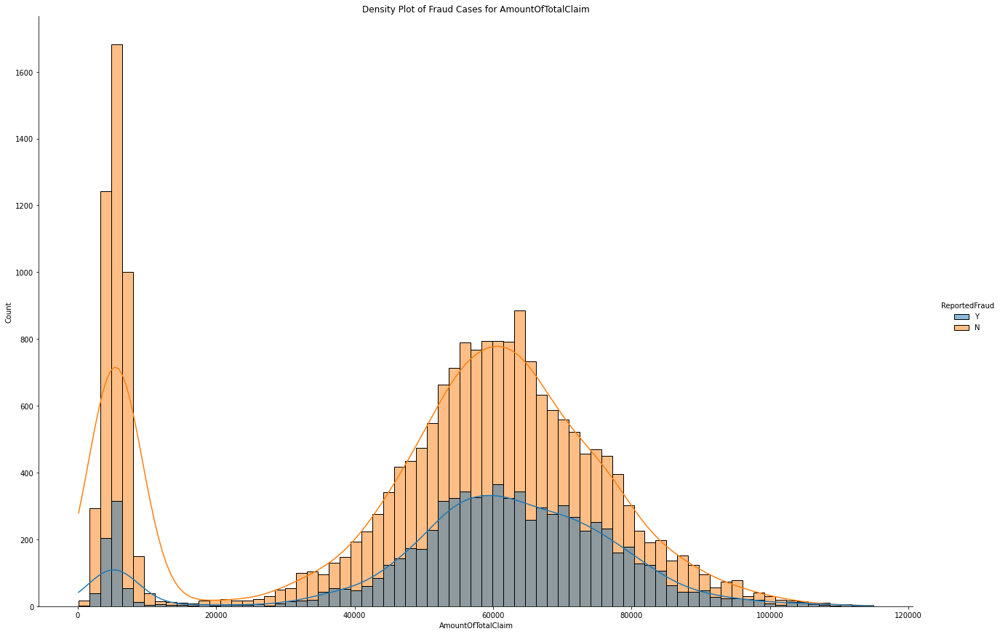

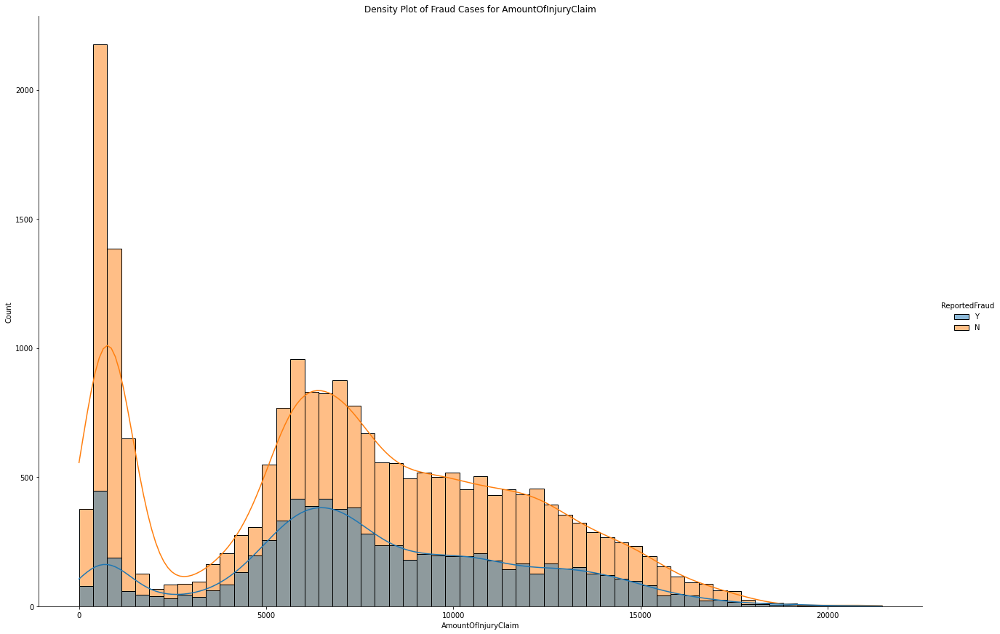

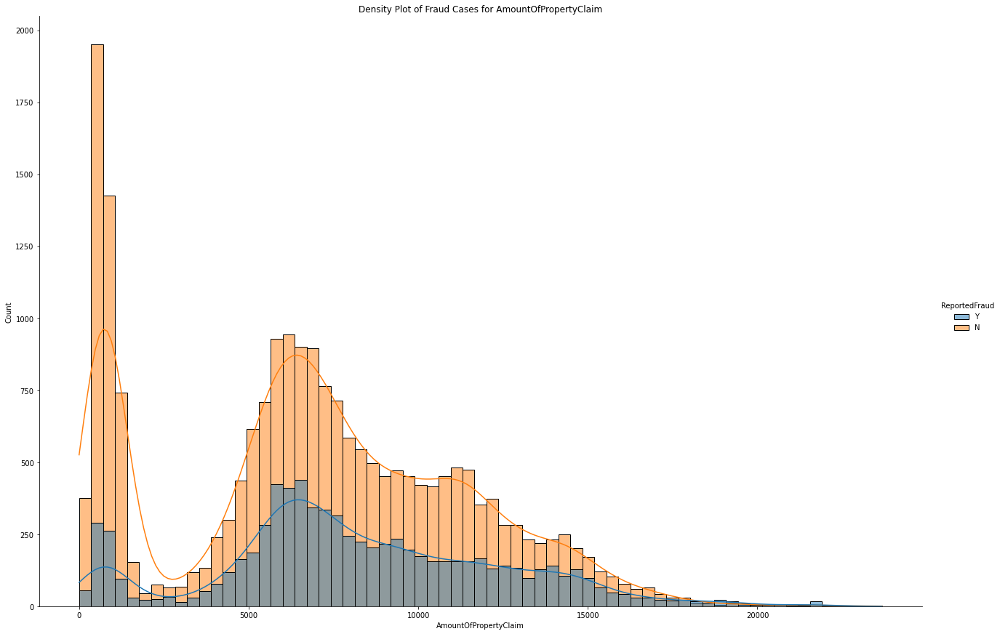

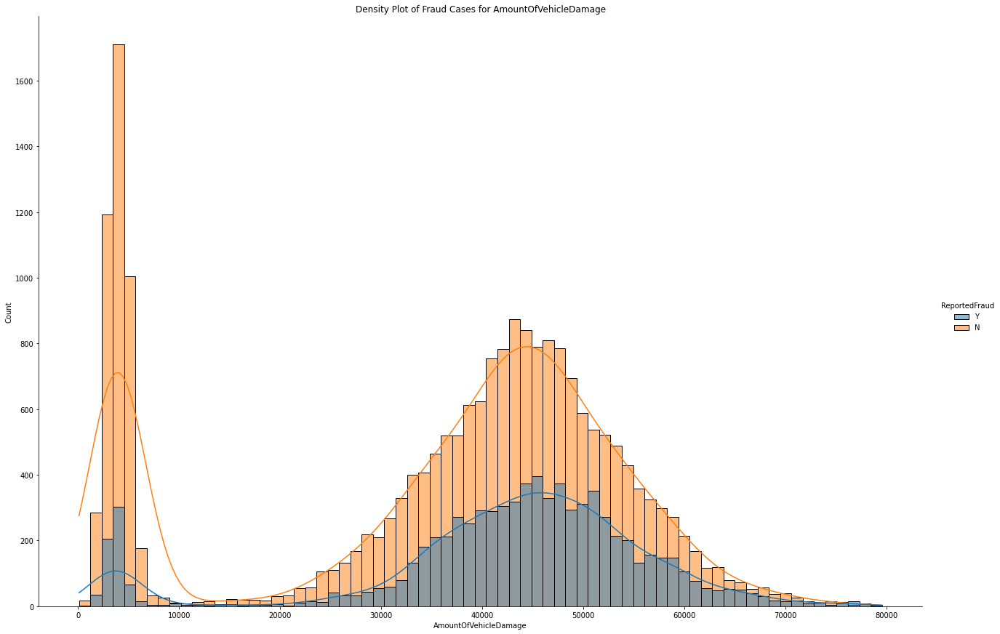

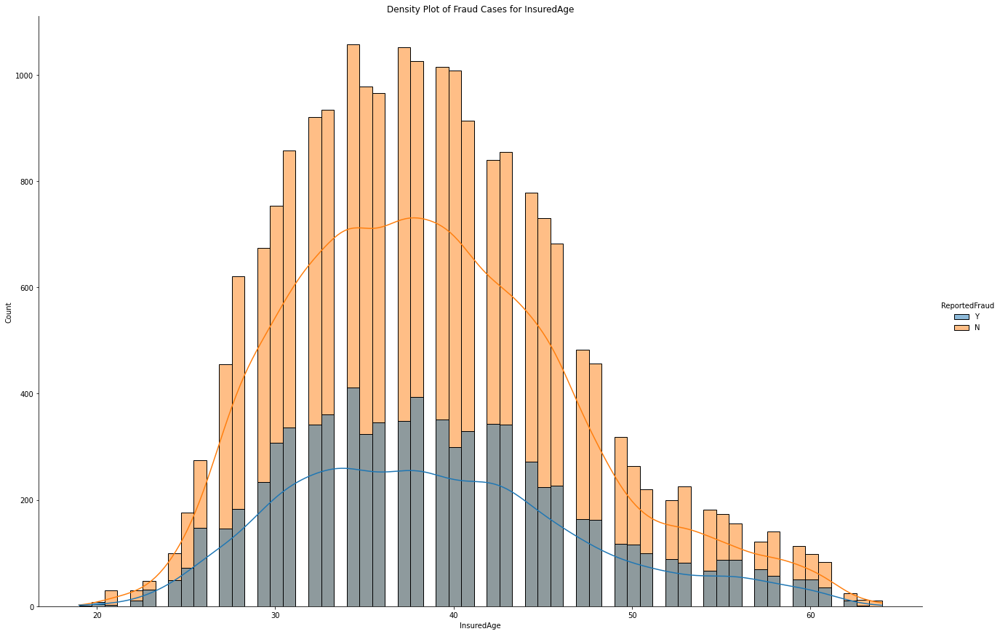

...

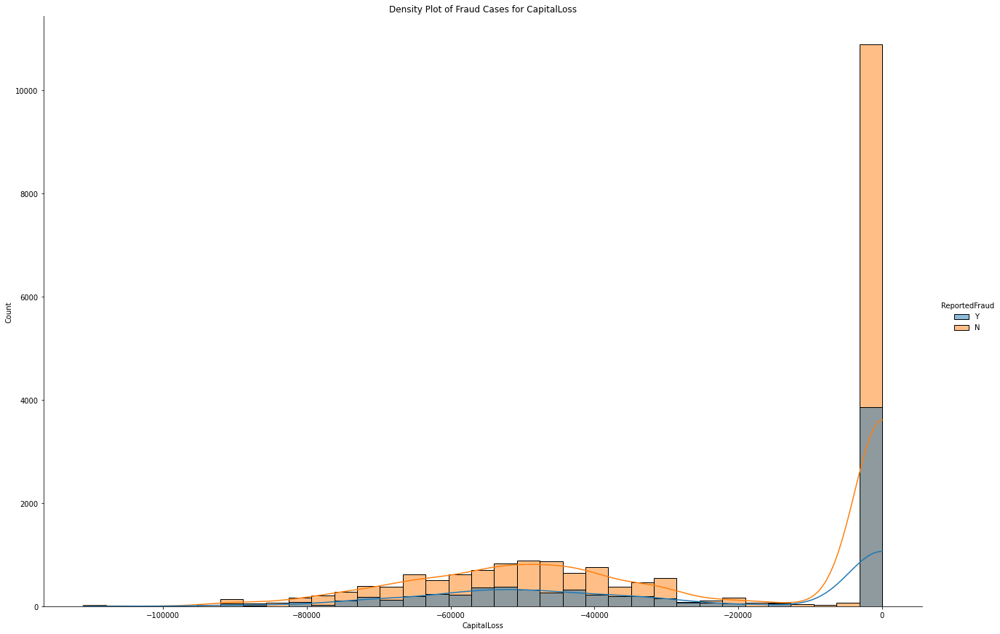

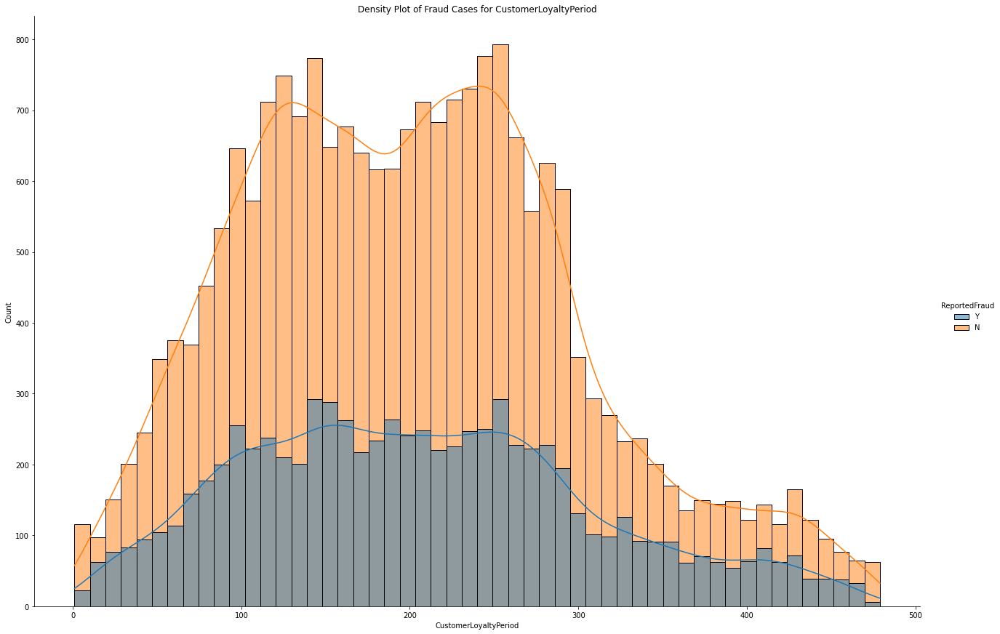

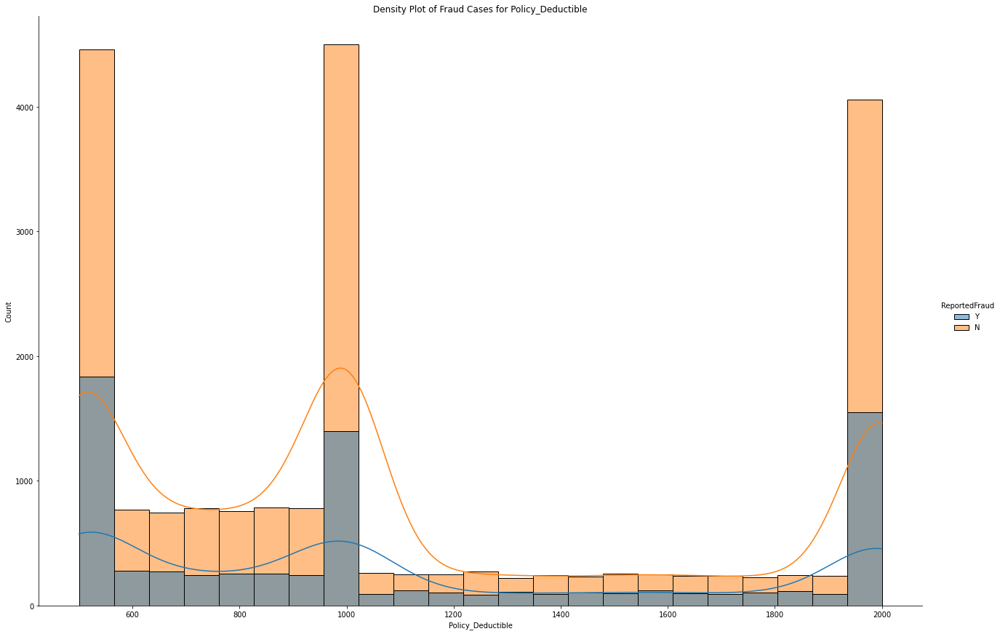

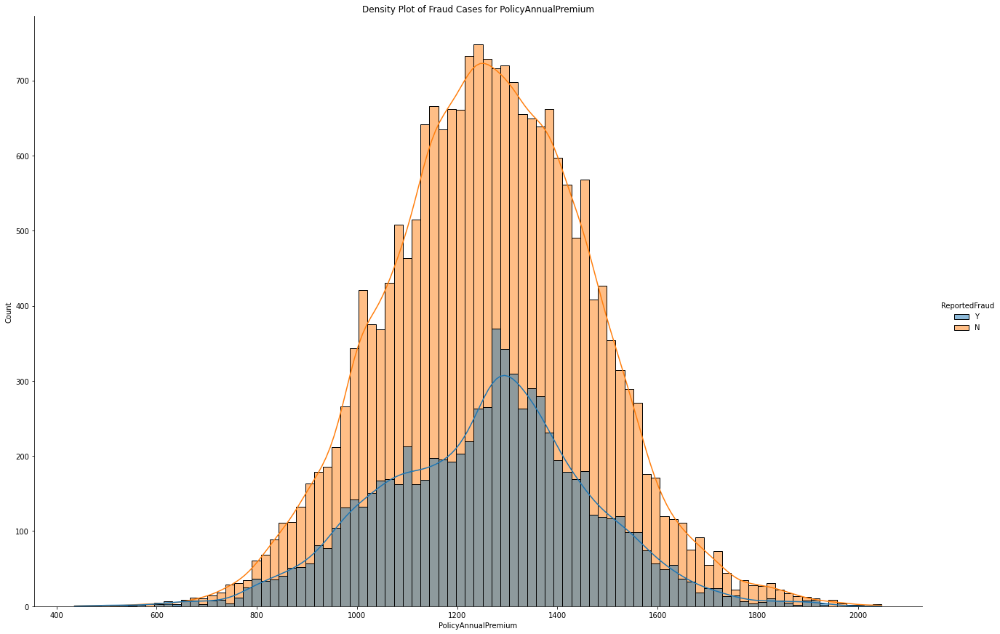

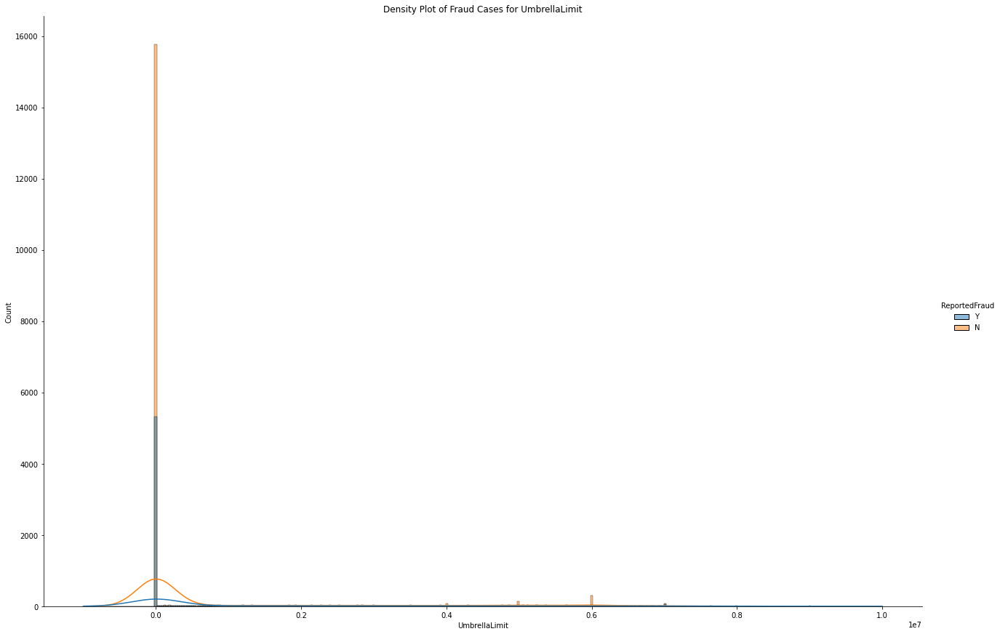

In [22]:
hue_order=['Y','N']
for num in numeric_cols:
  sns.displot(data=df, x=num, hue='ReportedFraud', kde=True, height=12, aspect=1.5, hue_order=hue_order)
  plt.title(f"Density Plot of Fraud Cases for {num}")
  plt.show()

#### Insights:

- NumberOfVehicles, Witnesses and BodilyInjuries should be plotted as a numerical ordinal vairable instead of continuous variable
- AmountOfTotalClaim, AmountOfInjuryClaim, AmountOfVehicleDamage have a similar distribution
  - Likely to have high correlation with each other. Means we can either keep one of the three features, or (based on high proportion of NA for AmountOfToTalClaim), we can also predict AmountOfTotalClaim from other 2 features to fill NA values.
- For the rest, the distribution of Fraud follows that of no Fraud.
- Since most of them do not have insurance for third parties, UmbrellaLimit is 0. Can remove 0 and plot displot again for this feature.

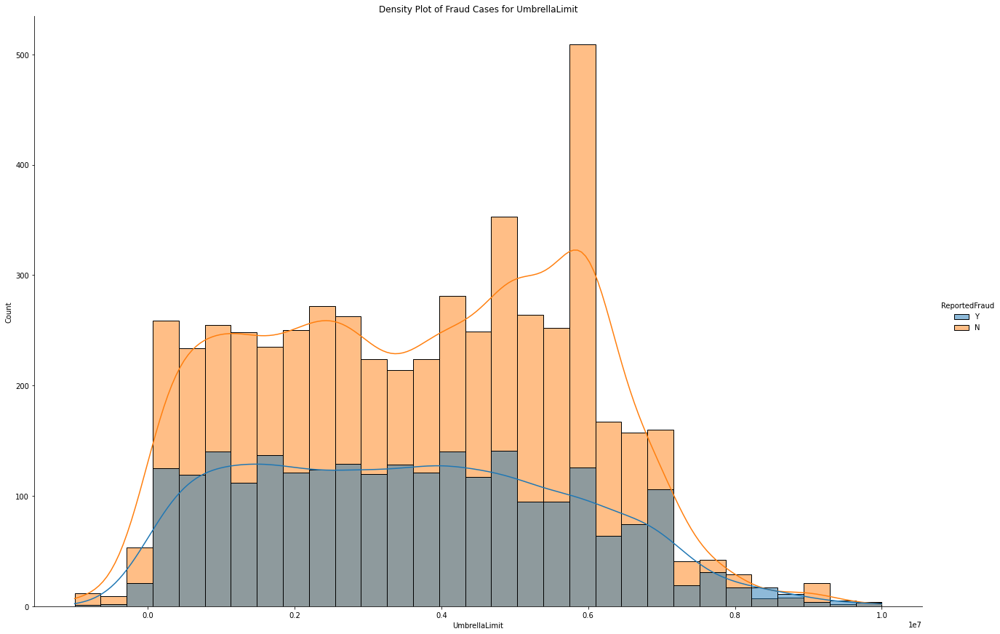

In [23]:
# Specifically for Umbrella Limit
hue_order=['Y','N']
sns.displot(data=df[df['UmbrellaLimit'] != 0], x='UmbrellaLimit', hue='ReportedFraud', kde=True, height=12, aspect=1.5, hue_order=hue_order)
plt.title(f"Density Plot of Fraud Cases for UmbrellaLimit")
plt.show()

Seems like the distribution is also quite similar

### Box Plots (Fraud vs Non-Fraud)

In [24]:
# Customer details related variables
import plotly.graph_objects as go
cols = ['InsuredAge', 'CapitalGains', 'CapitalLoss', 'CustomerLoyaltyPeriod']

for col in cols:
  Fraud_Flag = df['ReportedFraud']
  Y_var = df[col]
  fig = go.Figure()
  tr1 = go.Box(x=Fraud_Flag, y=Y_var, boxmean=True)
  fig.add_trace(tr1)
  fig.update_layout(title_text='{} Box Plot'.format(col), xaxis_title="ReportedFraud", yaxis_title="Number of Cases")
  fig.show(renderer="colab")

In [25]:
# Policy related variables
import plotly.express as px
cols = ['Policy_CombinedSingleLimit', 'Policy_Deductible', 'PolicyAnnualPremium', 'UmbrellaLimit',
        'NumberOfVehicles', 'BodilyInjuries', 'Witnesses', 'AmountOfTotalClaim', 'AmountOfInjuryClaim',
        'AmountOfPropertyClaim', 'AmountOfVehicleDamage']

for col in cols:
  Fraud_Flag = df['ReportedFraud']
  Y_var = df[col]
  fig = go.Figure()
  tr1 = go.Box(x=Fraud_Flag, y=Y_var, boxmean=True)
  fig.add_trace(tr1)
  fig.update_layout(title_text='{} Box Plot'.format(col), xaxis_title="ReportedFraud", yaxis_title="Number of Cases")
  fig.show(renderer="colab")

In [26]:
# Car demographic variables
import plotly.express as px
cols = ['VehicleYOM']

for col in cols:
  Fraud_Flag = df['ReportedFraud']
  Y_var = df[col]
  fig = go.Figure()
  tr1 = go.Box(x=Fraud_Flag, y=Y_var, boxmean=True)
  fig.add_trace(tr1)
  fig.update_layout(title_text='{} Box Plot'.format(col), xaxis_title="ReportedFraud", yaxis_title="Number of Cases")
  fig.show(renderer="colab")

#### Insights: 

*   UmbrellaLimit: Comparing the UmbrellaLimit boxplots of fraud and non-fraud cases, it is interesting to see that the quartiles of the fraud cases are significantly higher than that of non-fraud cases.
*   AmountOfVehicleDamage: Comparing the AmountOfVehicleDamage boxplots of fraud and non-fraud cases, we can see that the quartiles, mean and median of the fraud cases are significantly higher than that of non-fraud cases.



### Correlation Analysis (Numerical vs Numerical)

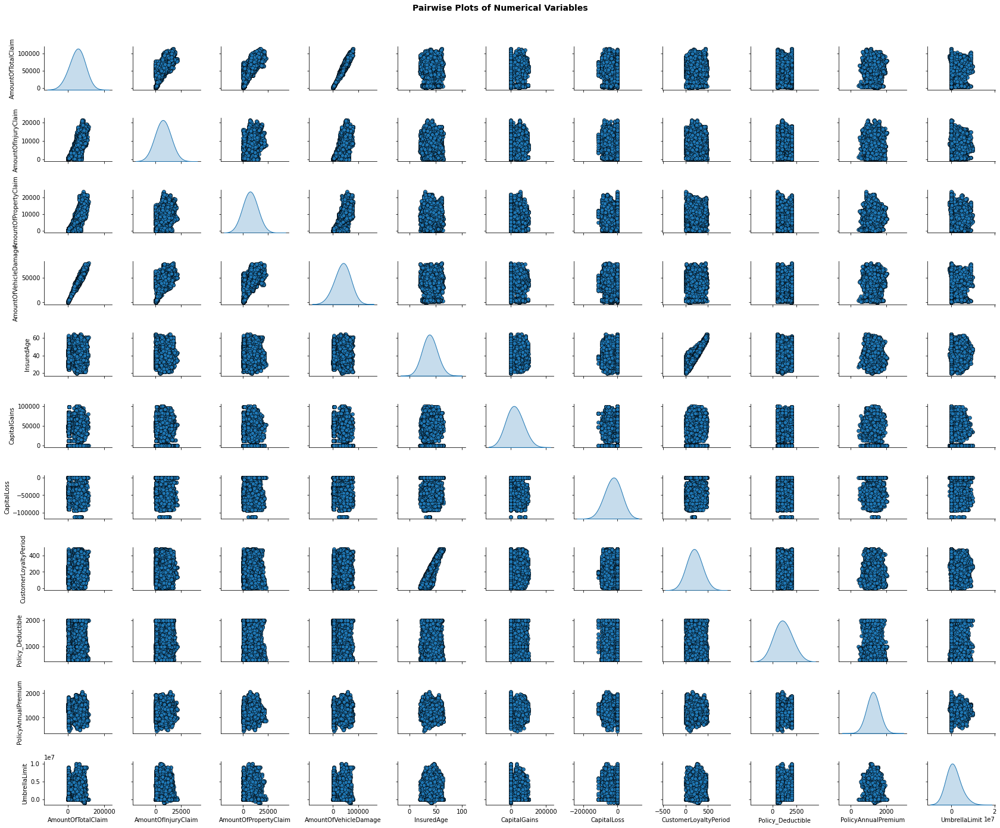

In [27]:
pg = sns.pairplot(df[numeric_cols], 
                  height=1.8, aspect=1.2,
                  plot_kws=dict(edgecolor="k", linewidth=0.5),
                  diag_kind="kde", 
                  diag_kws=dict(shade=True, bw_method=1.5)
                 )
fig = pg.fig 
fig.subplots_adjust(top=0.93, wspace=0.3)
t = fig.suptitle('Pairwise Plots of Numerical Variables', fontsize=14, fontweight='bold')

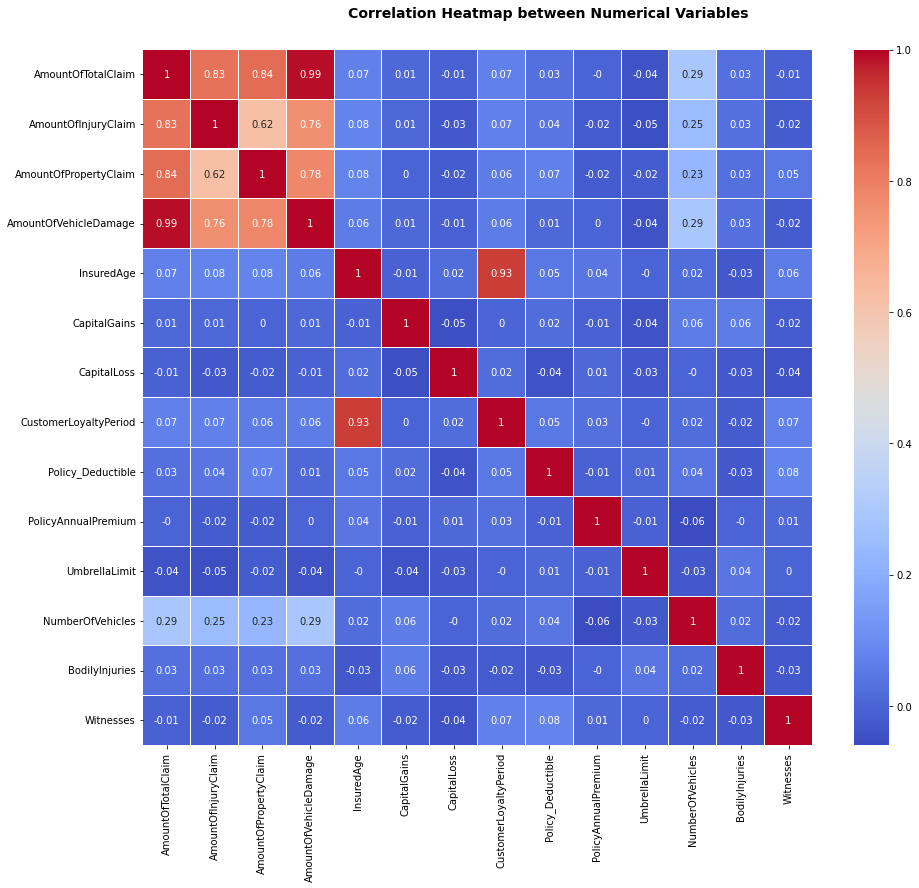

In [28]:
# correlation heatmap
fig, ax = plt.subplots(1,1, figsize=(15,12))

hm = sns.heatmap(round(df[numeric_cols + numeric_ord_cols].corr(),2), 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 #annot_kws={"size": 14},
                 linewidths=.05)

fig.subplots_adjust(top=0.93)

t = fig.suptitle('Correlation Heatmap between Numerical Variables', fontsize=14, fontweight='bold')

#### Insights:
- Again, AmountOfTotalClaim, AmountOfInjuryClaim, AmountOfPropertyClaim and AmountOfVehicleDamage are highly correlated. Can choose to take only 1 out of each.
- CustomerLoyaltyPeriod & InsuredAge are highly correlated, can take out 1 as well.

## Categorical Variables

In [29]:
# adding ordinal cols as well
identity_cols = ['CustomerID','VehicleID','InsurancePolicyNumber']
binary_cols = ['ReportedFraud']
binary_w_missing = ['PoliceReport','InsuredGender']
datetime_cols = ['DateOfIncident','IncidentTime','VehicleYOM', 'DateOfPolicyCoverage']
cat_ohe = ['TypeOfIncident','AuthoritiesContacted','IncidentState','IncidentCity','IncidentAddress','InsuredZipCode','InsuredOccupation','InsuredHobbies','Country','InsurancePolicyState','Policy_CombinedSingleLimit','InsuredRelationship','VehicleMake','VehicleModel']
cat_ord = ['SeverityOfIncident','InsuredEducationLevel', 'PropertyDamage']
numeric_cols = ['AmountOfTotalClaim','AmountOfInjuryClaim','AmountOfPropertyClaim','AmountOfVehicleDamage','InsuredAge','CapitalGains','CapitalLoss','CustomerLoyaltyPeriod','Policy_Deductible','PolicyAnnualPremium','UmbrellaLimit']
numeric_ord_cols = ['NumberOfVehicles','BodilyInjuries','Witnesses']

In [30]:
df_fillna = df.fillna('Missing')

### Bar Plots

In [31]:
for cat in binary_w_missing + cat_ohe + cat_ord + numeric_ord_cols:
  fig = px.histogram(df_fillna[cat], x='{}'.format(cat))
  fig.update_layout(showlegend=True, yaxis_title='Number of Total Cases',title="Total Cases Distribution",xaxis={'categoryorder':'total descending'})
  fig.show()

#### Insights:

The charts here show the breakdown of the total number of auto insurance claims by different categorical variables.

Some interesting insights include:
*   InsuredGender: The number of females who have filed for insurance claims are greater than the number of males.
*   TypeOfIncident: Most auto insurance claims involve vehicle collision-type of incidents, as compared to vehicle theft and parked car.
*   VehicleMake: The vehicle brand that is involved with the highest number of auto insurance claims is Saab.
*   SeverityOfIncident & NumberOfVehicles: Most of the incidents involve minor damage and only 1 vehicle.

From the plots above, we can see there are some missing values in the data. We will take appropriate steps to handle mising values later in our data pre-processing steps.



### Bar Plots (Fraud vs Non-Fraud)

In [32]:
for cat in binary_w_missing + cat_ohe + cat_ord + numeric_ord_cols:
  fig = px.histogram(df_fillna[[cat,'ReportedFraud']].value_counts().reset_index().rename(columns={0:'cases'}), x=cat,y='cases',color='ReportedFraud',barmode='group',title=f'Number of Reported Fraud Cases By {cat}')
  fig.show()

#### Insights:

In general: The distribution of Fraud and Non-Fraud is the same throughout the different categories, but this is not the case for a few features:
- Location: A few locations have a significantly higher number of Fraud than Non-Fraud cases
-  Vehicle Model: For example, model X6 has almost the same number of fraud as non-fraud cases
- SeverityOfIncident: There seems to be a higher number of fraud than non-fraud cases for major damage


Some other insights:
- Distribution of IncidentAddress and InsuredZipCode is exactly the same, will remove at least one of them
- Only one country in dataset (India), will remove country column

### Correlation Analysis (Categorical vs Categorical)

In [33]:
from scipy import stats

In [34]:
p_values = []
chai_stats = []
for cat1 in binary_w_missing + cat_ohe + cat_ord + numeric_ord_cols:
    for cat2 in binary_w_missing + cat_ohe + cat_ord + numeric_ord_cols:
            crosstab = pd.crosstab(df_fillna[cat1], df_fillna[cat2])
            chai2, p_val, _, _ = stats.chi2_contingency(crosstab)
            p_values.append((cat1, cat2, p_val))
            chai_stats.append((cat1, cat2, chai2))
     

chisquare = pd.DataFrame(p_values, columns=['cat1', 'cat2', 'p-value'])
chisquare.pivot_table(index='cat1', columns='cat2', values='p-value')

cat2,AuthoritiesContacted,BodilyInjuries,Country,IncidentAddress,IncidentCity,IncidentState,InsurancePolicyState,InsuredEducationLevel,InsuredGender,InsuredHobbies,InsuredOccupation,InsuredRelationship,InsuredZipCode,NumberOfVehicles,PoliceReport,Policy_CombinedSingleLimit,PropertyDamage,SeverityOfIncident,TypeOfIncident,VehicleMake,VehicleModel,Witnesses
cat1,,,,,,,,,,,,,,,,,,,,,,
AuthoritiesContacted,0.000000e+00,2.421157e-23,0.591706,0.0,1.243123e-84,2.004426e-106,1.430513e-33,3.949783e-66,4.185419e-34,9.172869e-242,2.294438e-101,1.867101e-65,0.0,0.000000e+00,7.060052e-35,1.877548e-71,8.082830e-08,0.000000e+00,0.000000e+00,1.595395e-133,0.000000e+00,6.024718e-38
BodilyInjuries,2.421157e-23,0.000000e+00,0.641168,0.0,1.734904e-45,2.515481e-35,4.424905e-38,3.756918e-50,1.966936e-02,3.228709e-104,5.855380e-156,4.544737e-19,0.0,3.605167e-25,3.390080e-03,2.672648e-17,6.233165e-14,9.903104e-02,4.415269e-27,1.142662e-49,9.829132e-130,5.001323e-37
Country,5.917063e-01,6.411680e-01,0.000000,1.0,5.756997e-01,9.338207e-01,1.584632e-01,4.790462e-01,9.915069e-01,5.198151e-01,4.128352e-01,5.245542e-01,1.0,9.450652e-01,1.156148e-01,9.864085e-01,6.482453e-01,6.516826e-01,9.319290e-01,6.918329e-01,4.342425e-01,7.248301e-01
IncidentAddress,0.000000e+00,0.000000e+00,1.000000,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
IncidentCity,1.243123e-84,1.734904e-45,0.575700,0.0,0.000000e+00,7.429060e-81,1.643487e-29,4.107690e-116,9.164942e-28,6.147317e-287,2.920582e-153,6.846657e-88,0.0,5.884949e-69,2.630189e-34,9.472969e-22,1.718478e-54,3.329307e-40,1.179188e-100,1.934526e-159,0.000000e+00,3.974851e-35
IncidentState,2.004426e-106,2.515481e-35,0.933821,0.0,7.429060e-81,0.000000e+00,4.548574e-41,5.428321e-125,3.366882e-29,0.000000e+00,8.899186e-203,5.170850e-83,0.0,3.798298e-46,3.077449e-44,5.197546e-40,2.169682e-22,8.825144e-72,4.708689e-126,1.750752e-169,0.000000e+00,5.958707e-56
InsurancePolicyState,1.430513e-33,4.424905e-38,0.158463,0.0,1.643487e-29,4.548574e-41,0.000000e+00,4.666362e-31,6.279961e-01,1.468111e-95,5.196744e-65,1.790214e-08,0.0,1.977048e-12,1.293063e-32,4.246100e-13,6.621602e-19,7.249208e-08,2.547937e-09,2.336211e-78,4.405841e-196,2.390091e-07
InsuredEducationLevel,3.949783e-66,3.756918e-50,0.479046,0.0,4.107690e-116,5.428321e-125,4.666362e-31,0.000000e+00,6.658187e-02,1.746533e-273,9.308941e-181,2.917763e-75,0.0,1.577219e-33,5.547907e-38,4.119707e-90,9.030447e-33,1.277533e-88,4.579677e-106,7.289225e-198,0.000000e+00,2.730655e-53
InsuredGender,4.185419e-34,1.966936e-02,0.991507,0.0,9.164942e-28,3.366882e-29,6.279961e-01,6.658187e-02,0.000000e+00,8.800642e-37,2.339758e-16,2.438973e-01,0.0,1.000519e-07,7.943811e-02,3.440453e-24,3.993402e-08,4.905779e-04,4.259120e-07,3.019108e-13,1.843226e-78,3.858038e-09


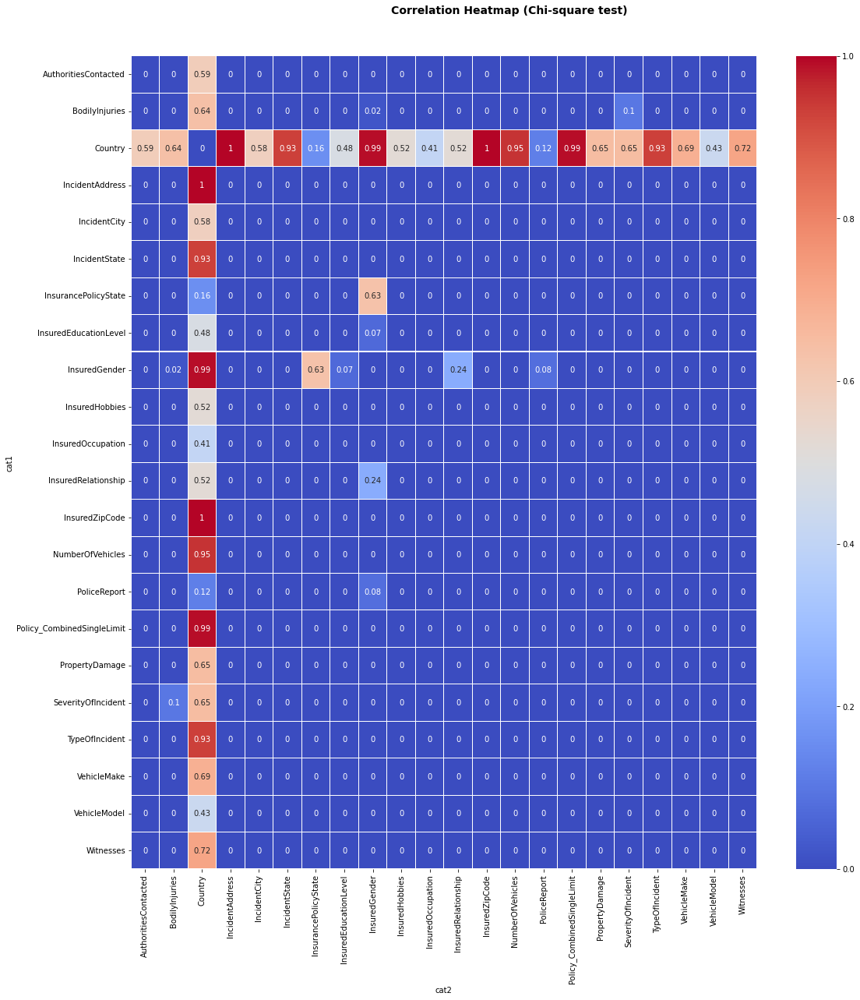

In [35]:
fig, ax = plt.subplots(1,1, figsize=(18,18))

hm = sns.heatmap(round(chisquare.pivot_table(index='cat1', columns='cat2', values='p-value'),2), 
                 ax=ax,           # Axes in which to draw the plot, otherwise use the currently-active Axes.
                 cmap="coolwarm", # Color Map.
                 #square=True,    # If True, set the Axes aspect to “equal” so each cell will be square-shaped.
                 annot=True, 
                 #annot_kws={"size": 14},
                 linewidths=.05)

fig.subplots_adjust(top=0.93)

t = fig.suptitle('Correlation Heatmap (Chi-square test)', fontsize=14, fontweight='bold')

#### Insights:
- There's only one value in country, so makes sense to have high p-value for these
- There's a high p-value between: 
  - InsuredGender & InsurancePolicyState
  - InsuredGender & InsuredEducationLevel
  - InsuredGender & InsuredRelationship
  - InsuredGender & PoliceReport;

It might be good to remove InsuredGender as well, since they have high correlation with quite a few other categorical variables and as seem from above, there does not seem to be a relationship between InsuredGender and ReportedFraud. 

## Time-related columns

datetime_cols = ['DateOfIncident','IncidentTime','VehicleYOM', 'DateOfPolicyCoverage']

In [36]:
for cat in datetime_cols:
  if df_fillna[cat].nunique() < 30:
    fig = px.histogram(df_fillna[[cat,'ReportedFraud']].value_counts().reset_index().rename(columns={0:'cases'}), x=cat,y='cases',color='ReportedFraud',barmode='group',title=f'Number of Reported Fraud Cases By {cat}', nbins=df_fillna[cat].nunique())
    fig.show()
  else:
    fig = px.histogram(df_fillna[[cat,'ReportedFraud']].value_counts().reset_index().rename(columns={0:'cases'}), x=cat,y='cases',color='ReportedFraud',barmode='group',title=f'Number of Reported Fraud Cases By {cat}')
    fig.show()

### Interesting Insights:
- Fraud = N for IncidentTime seems to follow a bimodal distribution, but this distribution is less visible in Fraud = Y.

## Identity columns

In [37]:
identity_cols

['CustomerID', 'VehicleID', 'InsurancePolicyNumber']

In [38]:
id_dfs = {}
for id in identity_cols:
  id_dfs[id] = df[[id,'ReportedFraud']].copy()
  try:
    id_dfs[id]['NumericID'] = id_dfs[id][id].str.extract('(\d+)')
  except AttributeError:  # ID is already an int
    id_dfs[id]['NumericID'] = id_dfs[id][id].astype(str)
  display(id_dfs[id])

,CustomerID,ReportedFraud,NumericID
0,Cust20065,N,20065
1,Cust37589,N,37589
2,Cust24312,N,24312
3,Cust5493,Y,5493
4,Cust7704,Y,7704
...,...,...,...
28831,Cust9773,N,9773
28832,Cust38439,N,38439
28833,Cust38444,N,38444
28834,Cust26466,N,26466


,VehicleID,ReportedFraud,NumericID
0,Vehicle30662,N,30662
1,Vehicle17183,N,17183
2,Vehicle33982,N,33982
3,Vehicle12299,Y,12299
4,Vehicle30447,Y,30447
...,...,...,...
28831,Vehicle24503,N,24503
28832,Vehicle9733,N,9733
28833,Vehicle1823,N,1823
28834,Vehicle9113,N,9113


,InsurancePolicyNumber,ReportedFraud,NumericID
0,129186,N,129186
1,146710,N,146710
2,133433,N,133433
3,114614,Y,114614
4,116825,Y,116825
...,...,...,...
28831,118894,N,118894
28832,147560,N,147560
28833,147565,N,147565
28834,135587,N,135587


In [39]:
20065 % 10

5

In [40]:
def last_digit(x, counter):
  try:
    return int(x[-(counter+1)])
  except:
    return 0

In [41]:
for id in id_dfs.keys():
  counter = 0
  while True:
    try:
      id_dfs[id][f'Digit {counter+1}'] = id_dfs[id]['NumericID'].str[-(counter+1)].astype(int)
      counter += 1
    except:
      break
  id_dfs[id][f'Digit {counter+1}'] = id_dfs[id]['NumericID'].apply(lambda x: last_digit(x, counter))
  
  display(id_dfs[id])

,CustomerID,ReportedFraud,NumericID,Digit 1,Digit 2,Digit 3,Digit 4,Digit 5
0,Cust20065,N,20065,5,6,0,0,2
1,Cust37589,N,37589,9,8,5,7,3
2,Cust24312,N,24312,2,1,3,4,2
3,Cust5493,Y,5493,3,9,4,5,0
4,Cust7704,Y,7704,4,0,7,7,0
...,...,...,...,...,...,...,...,...
28831,Cust9773,N,9773,3,7,7,9,0
28832,Cust38439,N,38439,9,3,4,8,3
28833,Cust38444,N,38444,4,4,4,8,3
28834,Cust26466,N,26466,6,6,4,6,2


,VehicleID,ReportedFraud,NumericID,Digit 1,Digit 2,Digit 3,Digit 4,Digit 5
0,Vehicle30662,N,30662,2,6,6,0,3
1,Vehicle17183,N,17183,3,8,1,7,1
2,Vehicle33982,N,33982,2,8,9,3,3
3,Vehicle12299,Y,12299,9,9,2,2,1
4,Vehicle30447,Y,30447,7,4,4,0,3
...,...,...,...,...,...,...,...,...
28831,Vehicle24503,N,24503,3,0,5,4,2
28832,Vehicle9733,N,9733,3,3,7,9,0
28833,Vehicle1823,N,1823,3,2,8,1,0
28834,Vehicle9113,N,9113,3,1,1,9,0


,InsurancePolicyNumber,ReportedFraud,NumericID,Digit 1,Digit 2,Digit 3,Digit 4,Digit 5,Digit 6,Digit 7
0,129186,N,129186,6,8,1,9,2,1,0
1,146710,N,146710,0,1,7,6,4,1,0
2,133433,N,133433,3,3,4,3,3,1,0
3,114614,Y,114614,4,1,6,4,1,1,0
4,116825,Y,116825,5,2,8,6,1,1,0
...,...,...,...,...,...,...,...,...,...,...
28831,118894,N,118894,4,9,8,8,1,1,0
28832,147560,N,147560,0,6,5,7,4,1,0
28833,147565,N,147565,5,6,5,7,4,1,0
28834,135587,N,135587,7,8,5,5,3,1,0


In [42]:
for id in id_dfs.keys():
  for col in id_dfs[id].columns:
    if 'Digit' in col:
      fig = px.bar(pd.pivot_table(id_dfs[id], columns='ReportedFraud',index=[col], aggfunc='count')['NumericID'].reset_index(), x=col, y=['N','Y'], barmode='group', title=f'Distribution of {col} for {id}')
      fig.show()

Not really much insights, just that we know we are unable to use Benford's Law in this case, since the distribution is quite equal.

# Suggestions from EDA

To change based on EDA:
- **ONLY KEEP AmountOfVehicleDamage** : High Corr between AmountOfTotalClaim, AmountOfInjuryClaim, AmountOfPropertyClaim and AmountOfVehicleDamage. Think AmountOfTotalClaim would be most important, but there are alot of NAs. Hence, taking the value with highest correlation with AmountOfTotalClaim, which is AmountOfVehicleDamage.
- **PropertyDamage** & **PoliceReport** : change to binary (missing = -1) + add missing column to indicate missing
- Remove **InsuredGender**
- Remove **InsuredHobbies**
- For **IncidentAddress** : Divide into train test split, get **suspicious locations**, change it to a binary value instead (Suspicious Location or Not, -1 would be not found (in val/test set)
- Remove **IncidentState** and **IncidentCity**
- Keep **SeverityOfIncident** as a categorical variable with no ordinality as it seems like major damage has an impact, placing it as ordinality might strip away that feature meaning.
- Adding feature **UmbrellaLimit_Missing** : since most of them are 0 not because the insurance value is 0, but because they do not have insurance for 3rd party.
- Drop **DateOfPolicyCoverage** since it would be aligned with **CustomerLoyaltyPeriod**

Future area of improvements:
- try to extract useful features from relationship in datetime features instead of only using ordinal values as it is
-  can try to extract something from VehicleMake as well